<a href="https://colab.research.google.com/github/katoy/alpha/blob/main/run_AI_Connect4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### AlphaGoをベースにしたサンプルまとめ

+ [AlphaGo の論文](https://www.nature.com/articles/nature24270.epdf)（ネイチャー）
+ [スタンフォード大学のテキスト](https://web.stanford.edu/~surag/posts/alphazero.html)
+ [AlphaGoのミニ版](https://github.com/tensorflow/minigo)（TensorFlowチーム）
+ [今回のConect4](https://github.com/AppliedDataSciencePartners/DeepReinforcementLearning)（Applied社）
+ [五目並べ](https://github.com/junxiaosong/AlphaZero_Gomoku)（MIT）
+ [オセロ](https://github.com/mokemokechicken/reversi-alpha-zero)（MIT）
+ [チェス](https://github.com/Zeta36/chess-alpha-zero)

# Deep Reinforcement Learning using AlphaZero methodology

Please see https://applied-data.science/blog/how-to-build-your-own-alphazero-ai-using-python-and-keras/ for further notes on the codebase

参考コード：GitHub／[AppliedDataSciencePartners/](https://github.com/AppliedDataSciencePartners/DeepReinforcementLearning)

In [ ]:
!git clone https://github.com/oshimamasara/DeepReinforcementLearning.git

Cloning into 'DeepReinforcementLearning'...
remote: Enumerating objects: 12, done.
remote: Counting objects: 100% (12/12), done.
remote: Compressing objects: 100% (12/12), done.
remote: Total 180 (delta 4), reused 0 (delta 0), pack-reused 168
Receiving objects: 100% (180/180), 2.64 MiB | 17.58 MiB/s, done.
Resolving deltas: 100% (83/83), done.


In [ ]:
%pwd

'/content'

In [ ]:
!pip install -r DeepReinforcementLearning/requirements.txt

In [ ]:
!pwd

/content


In [ ]:
%cd  DeepReinforcementLearning

/content/DeepReinforcementLearning


In [ ]:
%ls

agent.py   games/         loss.py    model.py          run.ipynb
config.py  initialise.py  main.py    README.md         settings.py
funcs.py   LICENSE        MCTS.py    requirements.txt  utils.py
game.py    loggers.py     memory.py  run/


## 1. First load the core libraries

In [ ]:
# -*- coding: utf-8 -*-
# %matplotlib inline
%load_ext autoreload
%autoreload 2

import numpy as np
np.set_printoptions(suppress=True)

from shutil import copyfile
import random
from importlib import reload
from keras.utils import plot_model


from game import Game, GameState
from agent import Agent
from memory import Memory
from model import Residual_CNN
from funcs import playMatches, playMatchesBetweenVersions
import loggers as lg
from settings import run_folder
import initialise
import pickle

/usr/local/lib/python3.6/dist-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


## 2. Now run this block to start the learning process

This block loops for ever, continually learning from new game data.

The current best model and memories are saved in the run folder so you can kill the process and restart from the last checkpoint.

confing.py　／　デフォルト値、推奨値だったら 

```
if len(memory.ltmemory) >= config.MEMORY_SIZE:
```

がなかなか満たされない。



In [ ]:
# 出力結果の縦幅拡大 実行しなくてもOK
from IPython.core.display import display, HTML
display(HTML("<style>.scroll_box { height:5000px  !important; }</style>"))

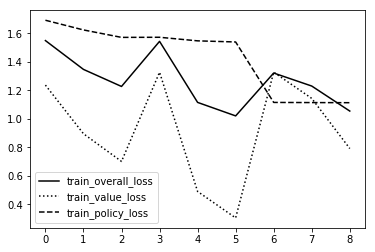




今のMEMORY SIZE: 100
TOURNAMENT...
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 
SCORES
{'best_player': 11, 'drawn': 1, 'current_player': 8}

STARTING PLAYER / NON-STARTING PLAYER SCORES
{'sp': 12, 'drawn': 1, 'nsp': 7}
{'best_player': [-1, -1, 1, 1, 1, -1, 1, -1, -1, -1, 0, 1, 1, 1, 1, 1, 1, -1, 1, -1], 'current_player': [1, 1, -1, -1, -1, 1, -1, 1, 1, 1, 0, -1, -1, -1, -1, -1, -1, 1, -1, 1]}
ITERATION NUMBER 3



ITERATION NUMBER 4
BEST PLAYER VERSION 1
SELF PLAYING 5 EPISODES...
1 2 3 4 5 

KeyboardInterrupt: ignored

<Figure size 432x288 with 0 Axes>

In [ ]:
# ほぼ永遠に続く

lg.logger_main.info('=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*')
lg.logger_main.info('=*=*=*=*=*=.      NEW LOG      =*=*=*=*=*')
lg.logger_main.info('=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*=*')

env = Game()

# If loading an existing neural network, copy the config file to root
if initialise.INITIAL_RUN_NUMBER != None:
    copyfile(run_archive_folder + env.name + '/run' + str(initialise.INITIAL_RUN_NUMBER).zfill(4) + '/config.py', './config.py')

import config

######## LOAD MEMORIES IF NECESSARY ########

if initialise.INITIAL_MEMORY_VERSION == None:
    memory = Memory(config.MEMORY_SIZE)
else:
    print('LOADING MEMORY VERSION ' + str(initialise.INITIAL_MEMORY_VERSION) + '...')
    memory = pickle.load( open( run_archive_folder + env.name + '/run' + str(initialise.INITIAL_RUN_NUMBER).zfill(4) + "/memory/memory" + str(initialise.INITIAL_MEMORY_VERSION).zfill(4) + ".p",   "rb" ) )

######## LOAD MODEL IF NECESSARY ########

# create an untrained neural network objects from the config file
current_NN = Residual_CNN(config.REG_CONST, config.LEARNING_RATE, (2,) + env.grid_shape,   env.action_size, config.HIDDEN_CNN_LAYERS)
best_NN = Residual_CNN(config.REG_CONST, config.LEARNING_RATE, (2,) +  env.grid_shape,   env.action_size, config.HIDDEN_CNN_LAYERS)

#If loading an existing neural netwrok, set the weights from that model
if initialise.INITIAL_MODEL_VERSION != None:
    best_player_version  = initialise.INITIAL_MODEL_VERSION
    print('LOADING MODEL VERSION ' + str(initialise.INITIAL_MODEL_VERSION) + '...')
    m_tmp = best_NN.read(env.name, initialise.INITIAL_RUN_NUMBER, best_player_version)
    current_NN.model.set_weights(m_tmp.get_weights())
    best_NN.model.set_weights(m_tmp.get_weights())
#otherwise just ensure the weights on the two players are the same
else:
    best_player_version = 0
    best_NN.model.set_weights(current_NN.model.get_weights())

#copy the config file to the run folder
copyfile('./config.py', run_folder + 'config.py')
plot_model(current_NN.model, to_file=run_folder + 'models/model.png', show_shapes = True)

print('\n')

######## CREATE THE PLAYERS ########

current_player = Agent('current_player', env.state_size, env.action_size, config.MCTS_SIMS, config.CPUCT, current_NN)
best_player = Agent('best_player', env.state_size, env.action_size, config.MCTS_SIMS, config.CPUCT, best_NN)
#user_player = User('player1', env.state_size, env.action_size)
iteration = 0

while 1:

    iteration += 1
    reload(lg)
    reload(config)
    
    print('ITERATION NUMBER ' + str(iteration))
    
    lg.logger_main.info('BEST PLAYER VERSION: %d', best_player_version)
    print('BEST PLAYER VERSION ' + str(best_player_version))

    ######## SELF PLAY ########
    print('SELF PLAYING ' + str(config.EPISODES) + ' EPISODES...')
    _, memory, _, _ = playMatches(best_player, best_player, config.EPISODES, lg.logger_main, turns_until_tau0 = config.TURNS_UNTIL_TAU0, memory = memory)
    print('\n')
    
    memory.clear_stmemory()
    
    if len(memory.ltmemory) >= config.MEMORY_SIZE:

        ######## RETRAINING ########
        print('RETRAINING...')
        current_player.replay(memory.ltmemory)
        print('')

        if iteration % 5 == 0:
            pickle.dump( memory, open( run_folder + "memory/memory" + str(iteration).zfill(4) + ".p", "wb" ) )
            print('ファイル作成：ITERATION NUMBER ' + str(iteration))

        lg.logger_memory.info('====================')
        lg.logger_memory.info('NEW MEMORIES')
        lg.logger_memory.info('====================')
        
        memory_samp = random.sample(memory.ltmemory, min(1000, len(memory.ltmemory)))
        
        for s in memory_samp:
            current_value, current_probs, _ = current_player.get_preds(s['state'])
            best_value, best_probs, _ = best_player.get_preds(s['state'])

            lg.logger_memory.info('MCTS VALUE FOR %s: %f', s['playerTurn'], s['value'])
            lg.logger_memory.info('CUR PRED VALUE FOR %s: %f', s['playerTurn'], current_value)
            lg.logger_memory.info('BES PRED VALUE FOR %s: %f', s['playerTurn'], best_value)
            lg.logger_memory.info('THE MCTS ACTION VALUES: %s', ['%.2f' % elem for elem in s['AV']]  )
            lg.logger_memory.info('CUR PRED ACTION VALUES: %s', ['%.2f' % elem for elem in  current_probs])
            lg.logger_memory.info('BES PRED ACTION VALUES: %s', ['%.2f' % elem for elem in  best_probs])
            lg.logger_memory.info('ID: %s', s['state'].id)
            lg.logger_memory.info('INPUT TO MODEL: %s', current_player.model.convertToModelInput(s['state']))

            s['state'].render(lg.logger_memory)
            
        ######## TOURNAMENT ########
        print('今のMEMORY SIZE: ' + str(len(memory.ltmemory)))
        print('TOURNAMENT...')
        scores, _, points, sp_scores = playMatches(best_player, current_player, config.EVAL_EPISODES, lg.logger_tourney, turns_until_tau0 = 0, memory = None)
        print('\nSCORES')
        print(scores)
        print('\nSTARTING PLAYER / NON-STARTING PLAYER SCORES')
        print(sp_scores)
        print(points)
        
        print('ITERATION NUMBER ' + str(iteration))
        print('\n\n')

        if scores['current_player'] > scores['best_player'] * config.SCORING_THRESHOLD:
            best_player_version = best_player_version + 1
            best_NN.model.set_weights(current_NN.model.get_weights())
            best_NN.write(env.name, best_player_version)

    else:
        print('MEMORY SIZE: ' + str(len(memory.ltmemory)))

In [ ]:
!pwd

/content/DeepReinforcementLearning


In [ ]:
# run フォルダを Google Drive にコピペ

# Google Driveをマウントしてから


%cp -r run ../drive/My\ Drive/2019

In [ ]:
## 事前にテストした際の run フォルダを使用する場合

# Google Drive

%cd ..
%cp -r drive/My\ Drive/2019/run DeepReinforcementLearning

/content


In [ ]:
# Self Training の結果、進捗の様子確認

%cat DeepReinforcementLearning/run/logs/logger_main.log
# %cat DeepReinforcementLearning/run/logs/logger_mcts.log
# %cat DeepReinforcementLearning/run/logs/logger_memory.log
# %cat DeepReinforcementLearning/run/logs/logger_model.log
#%cat DeepReinforcementLearning/run/logs/logger_tourney.log

#from IPython.display import Image
#Image("DeepReinforcementLearning/run/models/model.png")

## The following panels are not involved in the learning process

### Play matches between versions (use -1 for human player)

In [ ]:
!pwd
%cd DeepReinforcementLearning

/content
/content/DeepReinforcementLearning


In [ ]:
# Self Traing の結果、 最初の時と 7番目（run/models 内の version007.h5）に強いと言われた時の対戦

from game import Game
from funcs import playMatchesBetweenVersions
import loggers as lg

env = Game()
playMatchesBetweenVersions(env, 1, -1, 7, 10, lg.logger_tourney, 0)



1 Enter your chosen action: 1


IndexError: ignored

### Pass a particular game state through the neural network (setup below for Connect4)

In [ ]:
gs = GameState(np.array([
    0,0,0,0,0,0,0,
    0,0,0,0,0,0,0,
    0,0,0,0,0,0,0,
    0,0,0,0,0,0,0,
    0,0,0,0,0,0,0,
    0,0,0,0,0,0,0
]), 1)

preds = current_player.get_preds(gs)

print(preds)

(array([-0.9997567], dtype=float32), array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.14709674, 0.14368935, 0.1358187 , 0.14827529, 0.13440974,
       0.15824468, 0.13246547], dtype=float32), [35, 36, 37, 38, 39, 40, 41])


### See the layers of the current neural network

LAYER 0


<Figure size 216x0 with 0 Axes>

LAYER 1


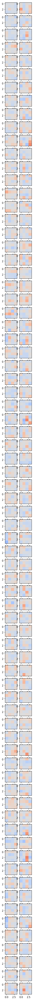

LAYER 2


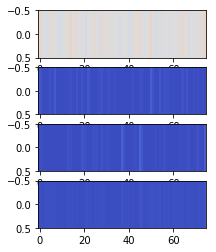

LAYER 3


<Figure size 216x0 with 0 Axes>

LAYER 4


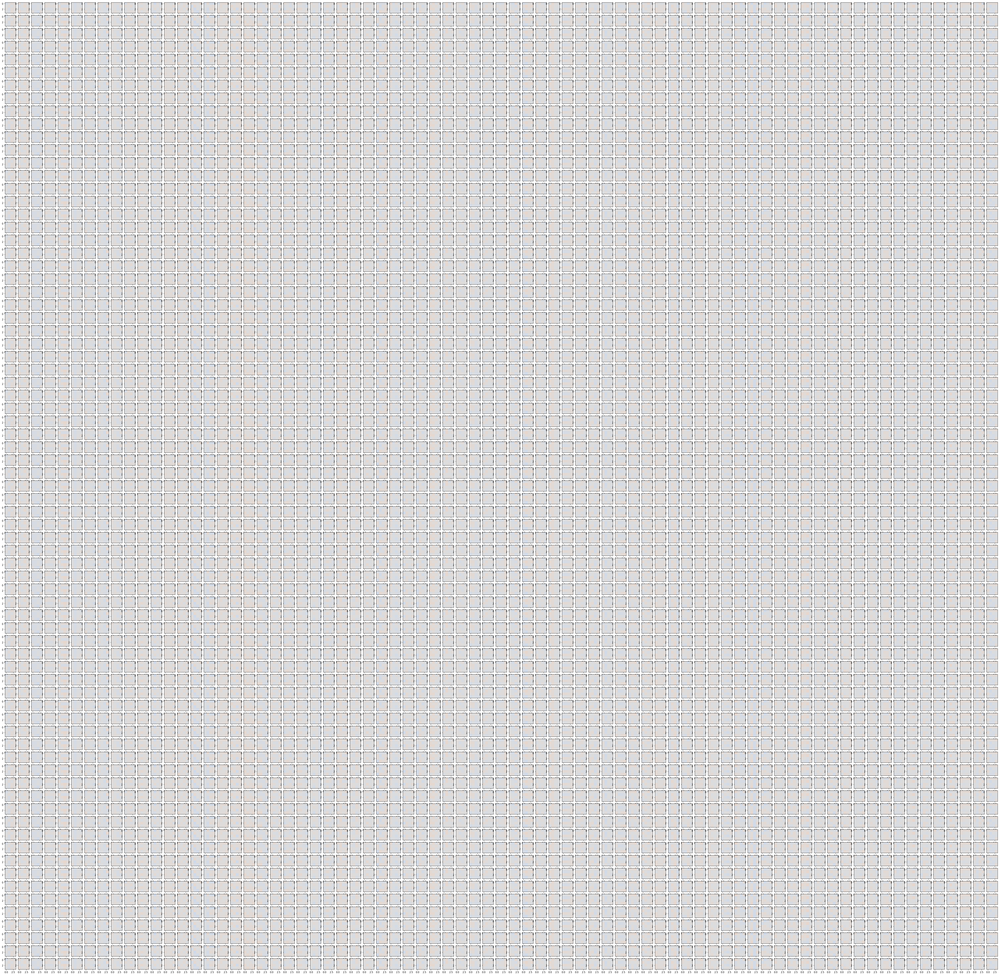

LAYER 5


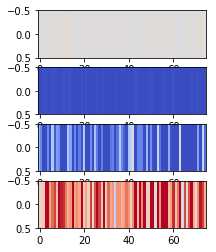

LAYER 6


<Figure size 216x0 with 0 Axes>

LAYER 7


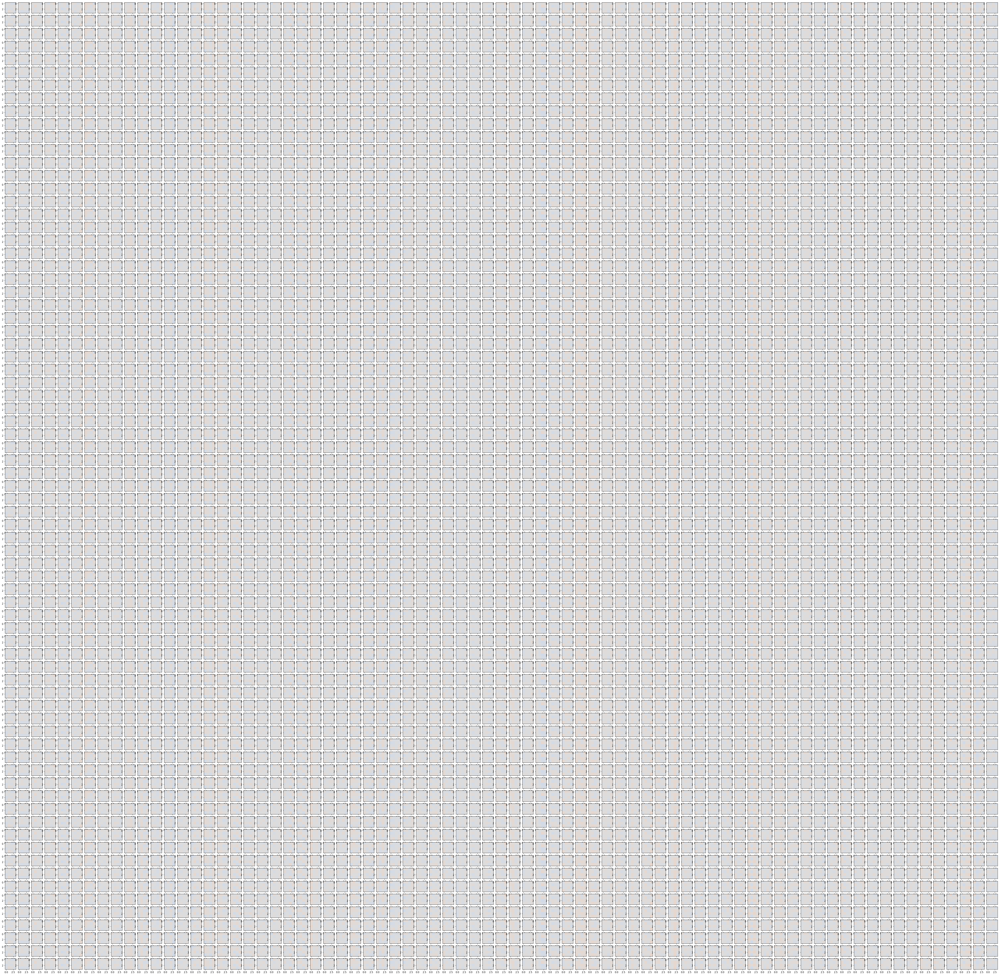

LAYER 8


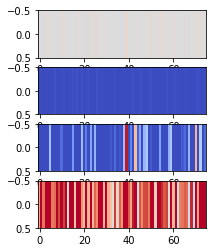

LAYER 9


<Figure size 216x0 with 0 Axes>

LAYER 10


<Figure size 216x0 with 0 Axes>

LAYER 11


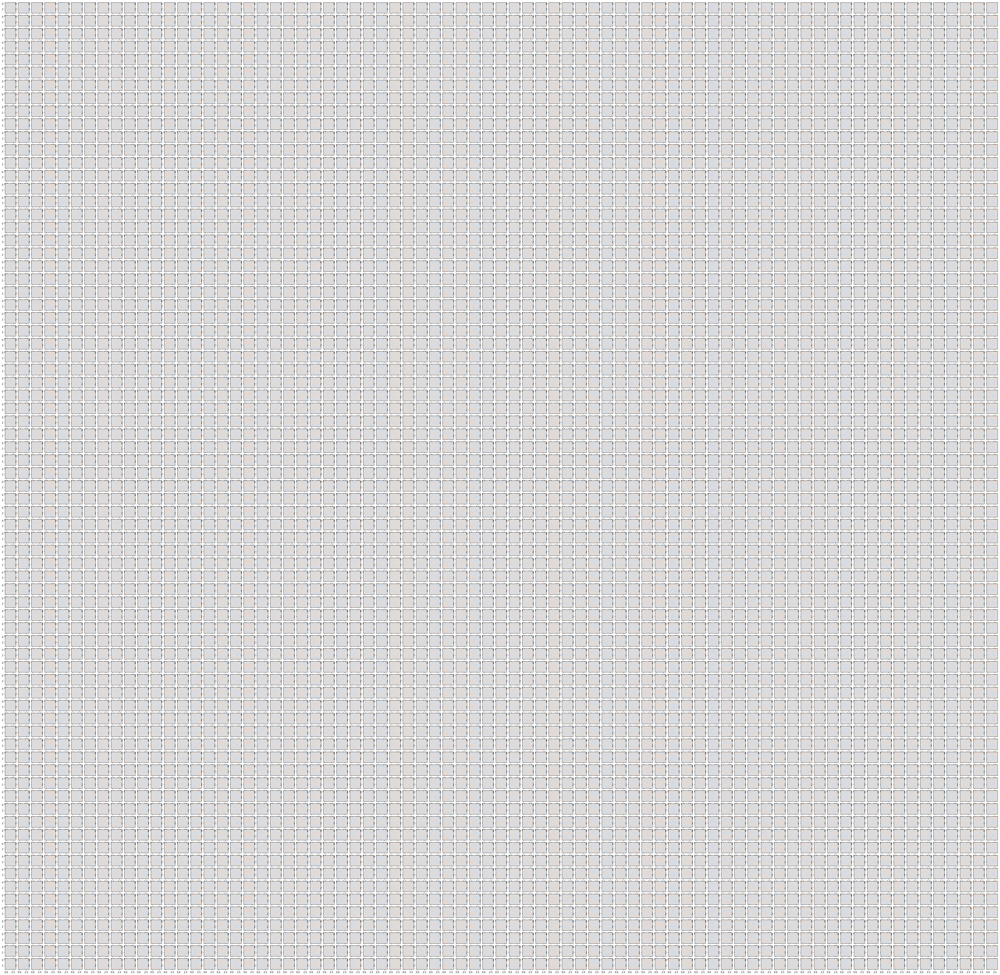

LAYER 12


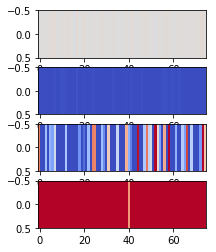

LAYER 13


<Figure size 216x0 with 0 Axes>

LAYER 14


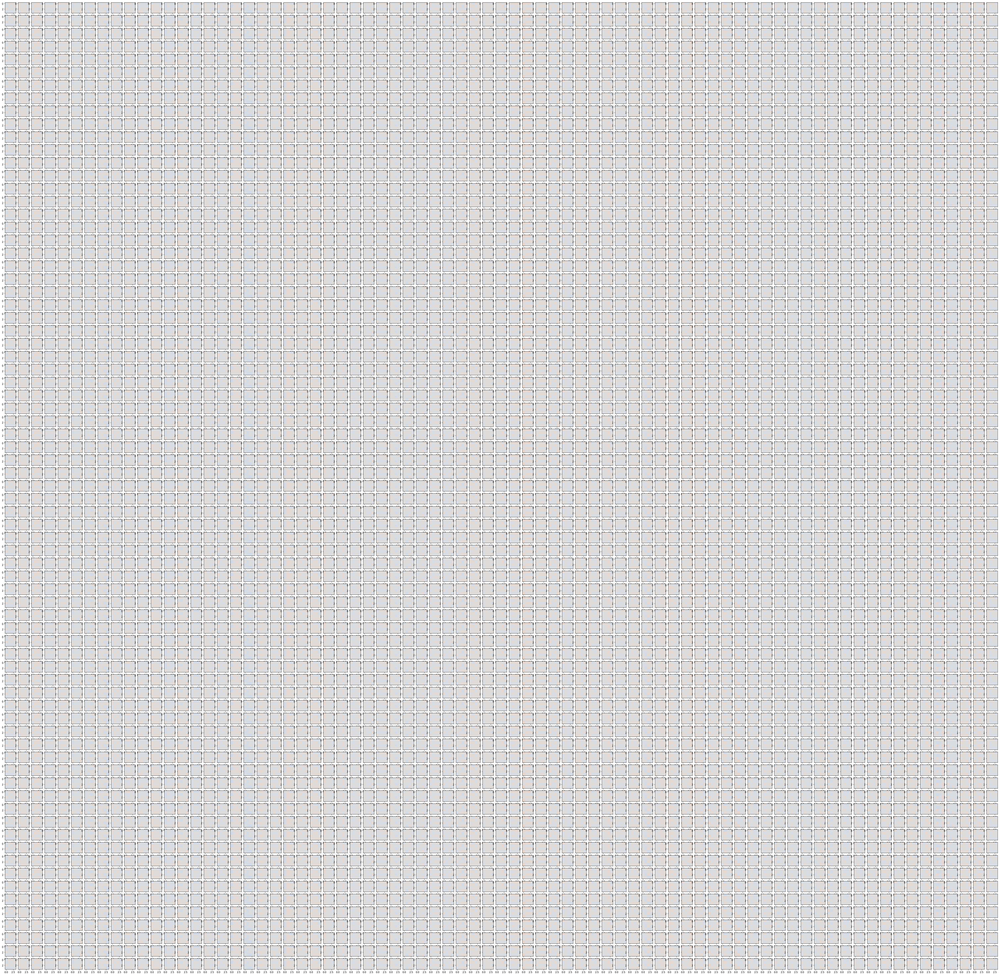

LAYER 15


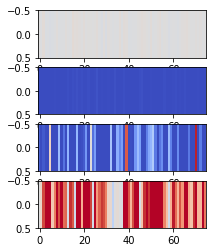

LAYER 16


<Figure size 216x0 with 0 Axes>

LAYER 17


<Figure size 216x0 with 0 Axes>

LAYER 18


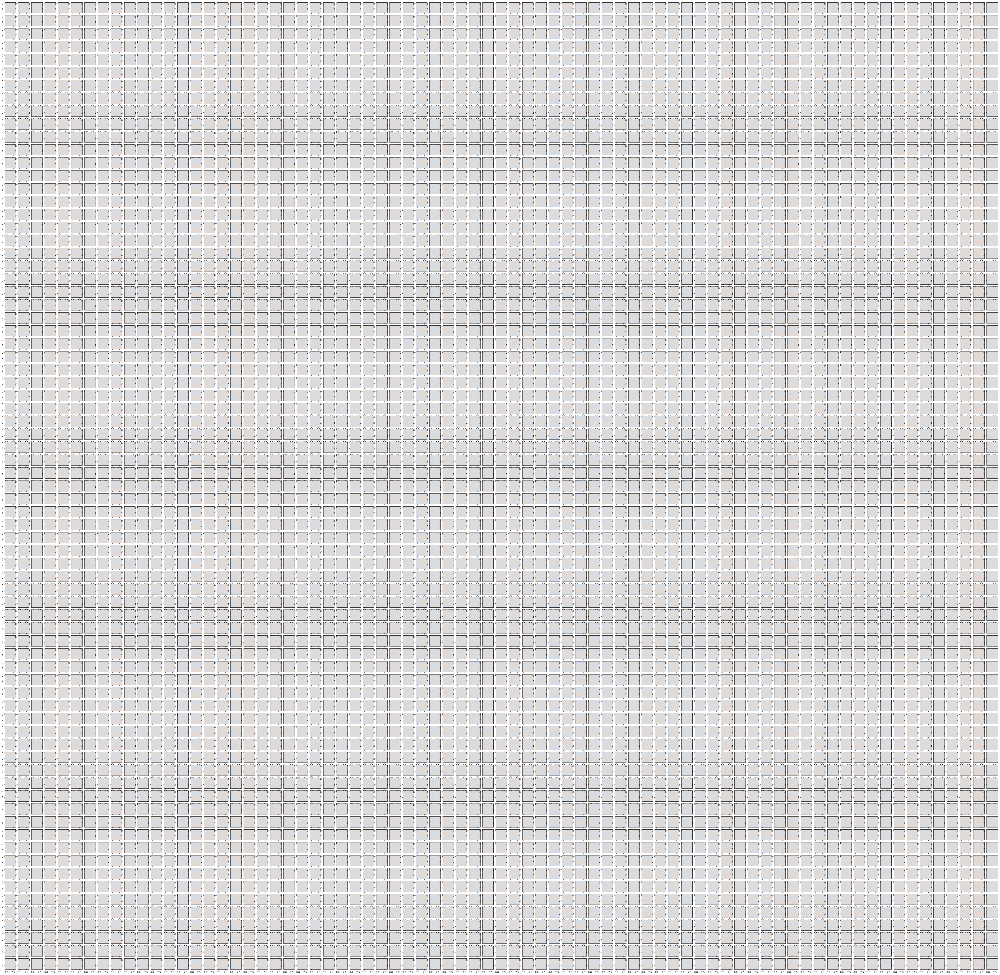

LAYER 19


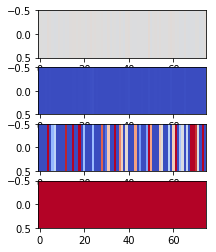

LAYER 20


<Figure size 216x0 with 0 Axes>

LAYER 21


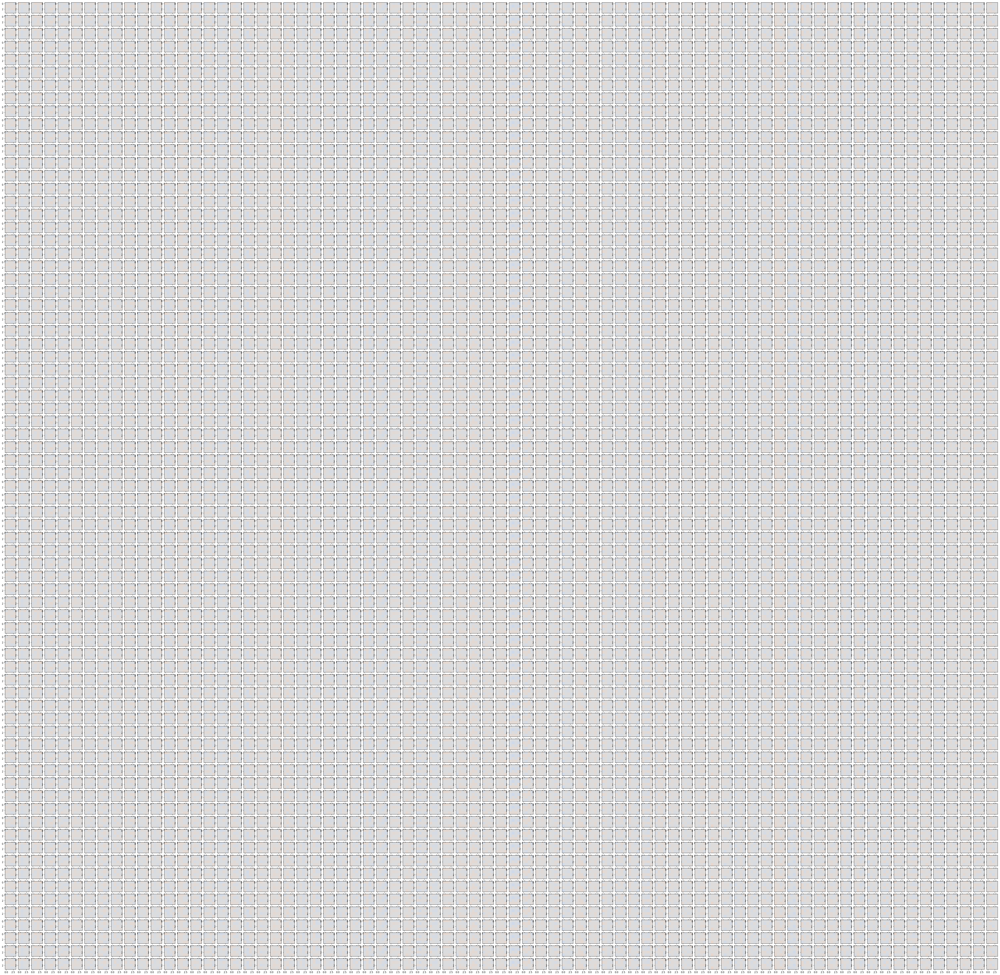

LAYER 22


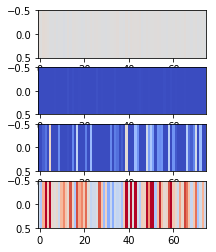

LAYER 23


<Figure size 216x0 with 0 Axes>

LAYER 24


<Figure size 216x0 with 0 Axes>

LAYER 25


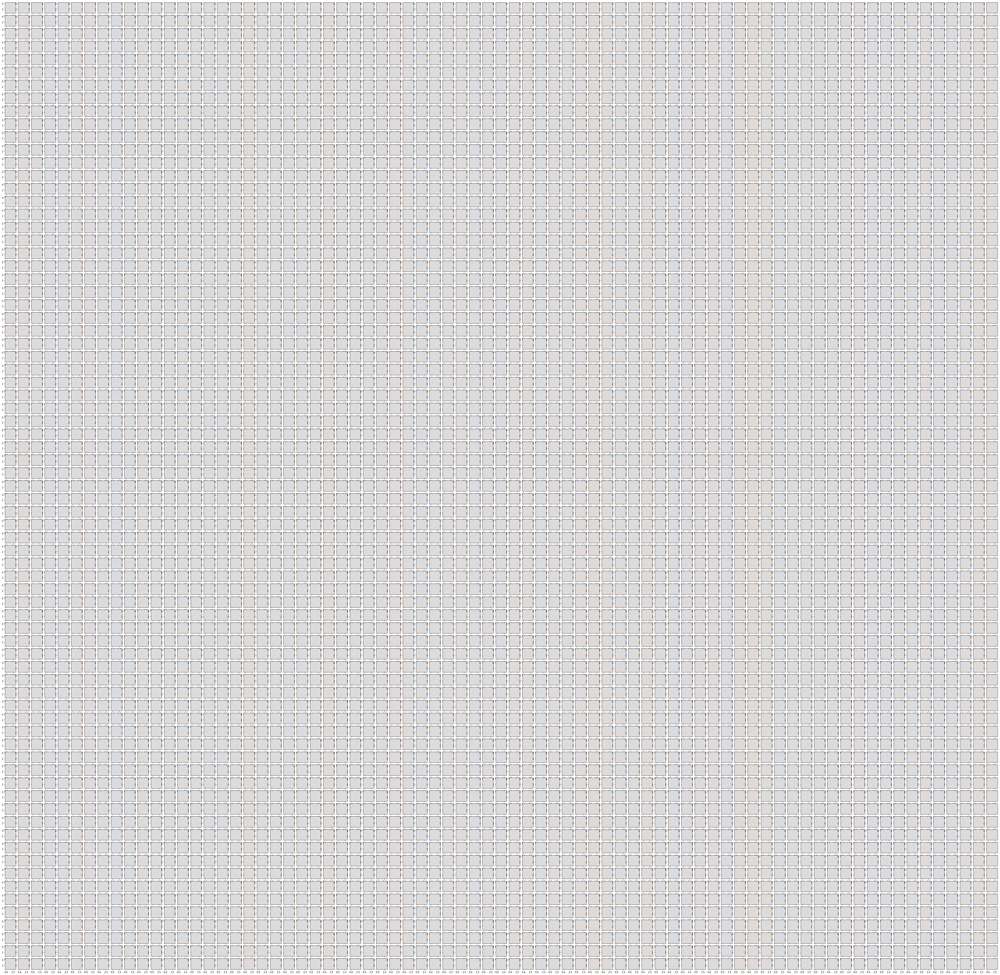

LAYER 26


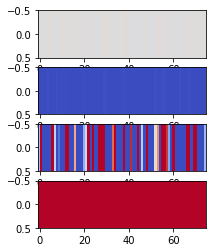

LAYER 27


<Figure size 216x0 with 0 Axes>

LAYER 28


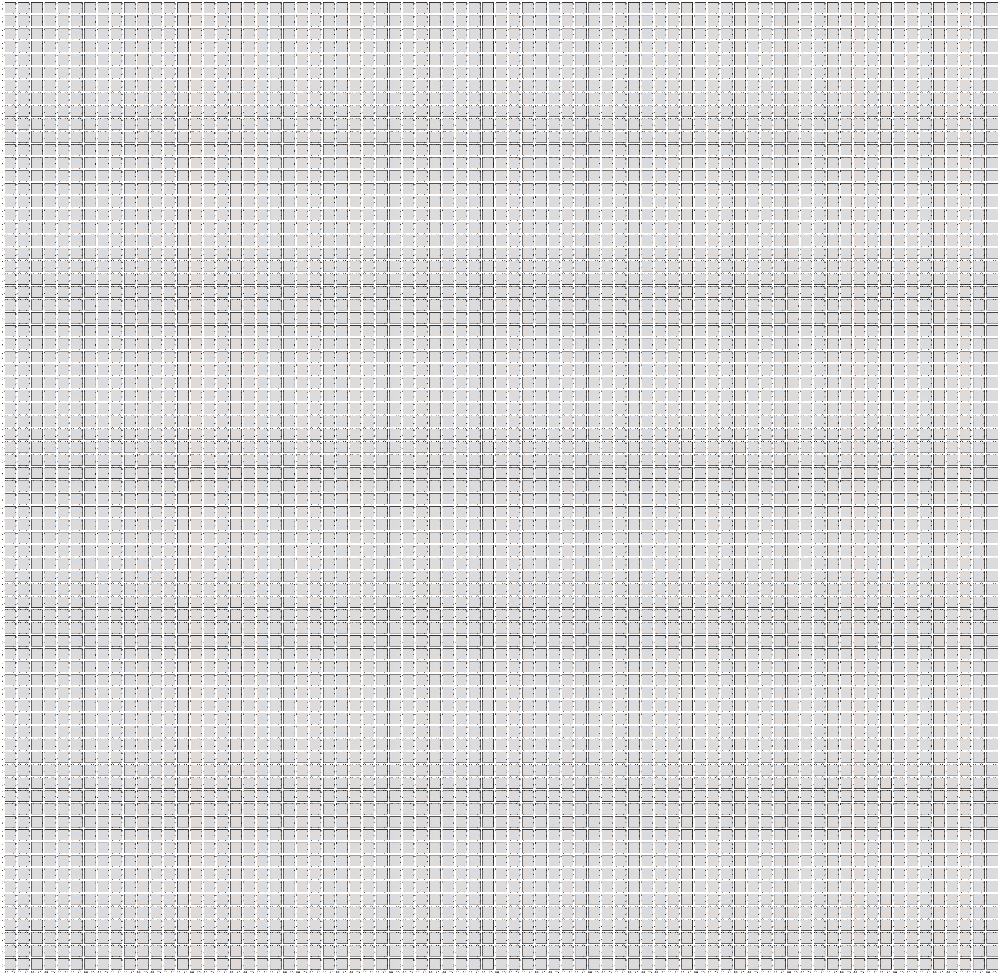

LAYER 29


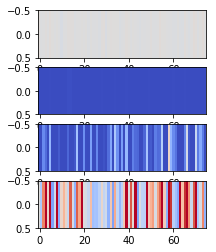

LAYER 30


<Figure size 216x0 with 0 Axes>

LAYER 31


<Figure size 216x0 with 0 Axes>

LAYER 32


In [ ]:
current_player.model.viewLayers()

### Output a diagram of the neural network architecture

In [ ]:
from keras.utils import plot_model
plot_model(current_NN.model, to_file=run_folder + 'models/model.png', show_shapes = True)